In [16]:
import pickle
import torch
import dgl
import matplotlib.pyplot as plt
import networkx as nx
from classes import *
from torch.utils.data import DataLoader
import pickle
from torch.utils.tensorboard import SummaryWriter
import torch.nn.functional as F
import numpy as np
from dgl import DGLGraph
from mpl_toolkits.mplot3d import Axes3D
from knn import *
from matplotlib import animation
import math



In [17]:
data_path = '../data/inc_cube_data.pickle'

with open(data_path,"rb") as f:
  dataa = pickle.load(f)




In [18]:
model_path = 'models/deepcube16.pth'
net = deepcustNet()
net.load_state_dict(torch.load(model_path))
net.eval()

deepcustNet(
  (layer1): CustomConv(
    (theta): Linear(in_features=8, out_features=64, bias=True)
  )
  (layer2): CustomConv(
    (theta): Linear(in_features=128, out_features=64, bias=True)
  )
  (layer5): CustomConv(
    (theta): Linear(in_features=128, out_features=3, bias=True)
  )
)

In [19]:
i=30001
g = knn_graph_edges(16)  #.to(device=device, non_blocking=True)
features= dataa[i]["coor"]  #.to(device=device, non_blocking=True)
newfeatures= np.hstack((dataa[i]["coor"],np.zeros((features.shape[0],1))))
targets = dataa[i]["visible"]
for idx,col in enumerate(newfeatures):
    if idx not in targets:
        newfeatures[idx] = np.array([0,0,0,1])
features_tens = torch.Tensor(features)
newfeatures = torch.Tensor(newfeatures)
# y = torch.Tensor(y)
campos = dataa[i]["cam"]
g = DGLGraph(g)
# print(campos)



In [20]:
##one frame of monkey
# fig = plt.figure(figsize=(10,10))
# ax = fig.add_subplot(111, projection='3d')
# xs = features[:,0]
# ys = features[:,1]
# zs = features[:,2]
# colors = (features-features.min(axis=0))/(features.max(axis=0)-features.min(axis=0))
# ax.set_title('Truth')

# for j in range(list(g.edges()[0].size())[0]):
#     node1 = g.edges()[0][j]
#     node2 = g.edges()[1][j]
#     x = np.array((features[node1][0], features[node2][0]))
#     y = np.array((features[node1][1], features[node2][1]))
#     z = np.array((features[node1][2], features[node2][2]))

# # Plot the connecting lines
#     ax.plot(x, y, z, c='black', alpha=0.5)
# # elev = 20
# # azim = 125
# elev = 0
# azim = 330
# ax.view_init(elev=elev, azim=azim)
# ax.scatter3D(xs,ys,zs, c=colors,edgecolors='k', alpha=0.7,s=70 )
# plt.show()


In [21]:
## animation of mionkey
# fig = plt.figure(figsize=(8,8))
# ax = fig.add_subplot(111, projection='3d')
# k=4
# ax.set_title('{} nearest'.format(k))
# def init():
#     ax.scatter3D(xs,ys,zs, c=colors,edgecolors='k', alpha=0.7,s=70 )

#     for j in range(list(g.edges()[0].size())[0]):
#         node1 = g.edges()[0][j]
#         node2 = g.edges()[1][j]
#         x = np.array((features[node1][0], features[node2][0]))
#         y = np.array((features[node1][1], features[node2][1]))
#         z = np.array((features[node1][2], features[node2][2]))

#         # Plot the connecting lines
#         ax.plot(x, y, z, c='black', alpha=0.5)
#     return fig

# def animate(i):
#     ax.view_init(elev=10., azim=i*4)
#     return fig

# # Animate
# anim = animation.FuncAnimation(fig, animate, init_func=init,
#                                frames=90, interval=20)
# print("lol")
# # Save
# anim.save('basic_animation.mp4', writer = "ffmpeg",fps=30, extra_args=['-vcodec', 'libx264'])

# print("lol2")
# # In[46]:


# plt.rcParams["animation.html"] = "jshtml"
# anim

In [22]:
featurest = torch.Tensor(newfeatures)   #.to(device=device, non_blocking=True)
outputt = net(g,featurest)
output = outputt.cpu().detach().numpy()

[[ 2.439789   -0.17287593  0.18788135]
 [ 2.4340625  -0.07769608  0.20273678]
 [ 2.447864   -0.12725846  0.24524267]
 ...
 [ 3.542291   -0.31521097  0.0183199 ]
 [ 3.0457125  -0.15787496  0.44518656]
 [ 3.3206682   0.1492604  -0.44110653]]


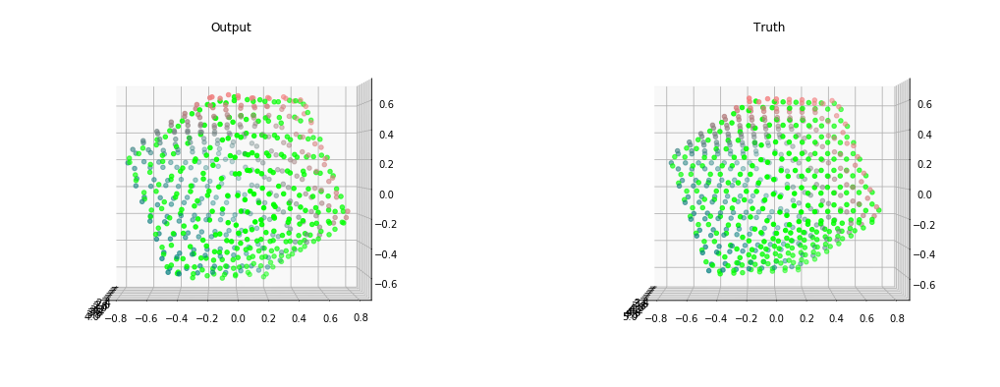

L1Loss:0.015387201681733131


In [23]:
print(output)
fig = plt.figure(figsize=(18,7))
ax = fig.add_subplot(121, projection='3d')
X = output[:,0]
Y = output[:,1]
Z = output[:,2]
temp = np.array([X+Y+Z])
temp = (temp-temp.min())/(temp.max()-temp.min())
colors = np.hstack((temp.T,np.zeros((features.shape[0],2))+0.5))

for idx,col in enumerate(output):
    if idx not in targets:
        colors[idx] = np.array([0,1,0])


ax.set_title('Output')
ax2 = fig.add_subplot(122, projection='3d')
xs = features[:,0]
ys = features[:,1]
zs = features[:,2]
# xs[target]=0
# ys[target]=0
# zs[target]=0
colors2 = (features-features.min(axis=0))/(features.max(axis=0)-features.min(axis=0))
temp = np.array([xs+ys+zs])
temp = (temp-temp.min())/(temp.max()-temp.min())
colors2 = np.hstack((temp.T,np.zeros((features.shape[0],2))+0.5))
for idx,col in enumerate(output):
    if idx not in targets:
        colors2[idx] = np.array([0,1,0])
ax2.set_title('Truth')
ax2.set_xlim(3.4,5)


r= (campos[0]**2+ campos[1]**2+ campos[2]**2)**0.5
rou = math.acos(campos[2]/r)
theta = math.asin(campos[1]/(r*math.sin(rou)))
elev = rou
azim = theta

# elev = -30
# azim = 125

ax.view_init(elev=elev, azim=azim)
ax2.view_init(elev=elev, azim=azim)
ax.scatter3D(X, Y, Z, c=colors )
ax2.scatter3D(xs, ys, zs,c=colors2)
loss = F.l1_loss(outputt,features_tens).item()
plt.show()
print("L1Loss:{}".format(loss))



lol
lol2


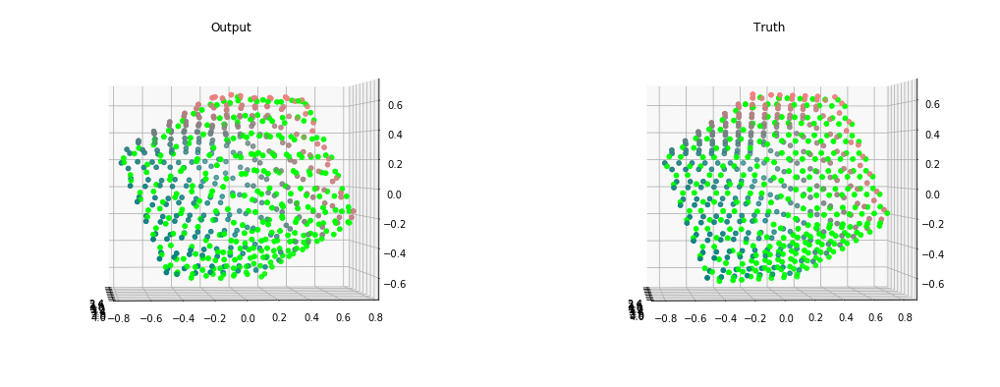

In [24]:
fig = plt.figure(figsize=(18,7))
ax = fig.add_subplot(121, projection='3d')
ax.set_title('Output')
ax2 = fig.add_subplot(122, projection='3d')
ax2.set_title('Truth')
ax.set_ylim(-0.8,0.8)

def init():
    ax.scatter3D(X, Y, Z, c=colors )
    ax2.scatter3D(xs, ys, zs,c=colors2)
    return fig

def animate(i):
    ax.view_init(elev=rou, azim=i*4)
    ax2.view_init(elev=rou, azim=i*4)
    return fig

# Animate
anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=90, interval=20)
print("lol")
# Save
anim.save('basic_animation.mp4', writer = "ffmpeg",fps=30, extra_args=['-vcodec', 'libx264'])

print("lol2")
# In[46]:


plt.rcParams["animation.html"] = "jshtml"
anim